In [503]:
import numpy as np
from sklearn.manifold import MDS
import matplotlib.pyplot as plt

## Ajout du chemin source
import os
import sys
NumAppPath = os.path.abspath('../../NumApp')
sys.path.append(NumAppPath)

dataPath = os.path.join(NumAppPath,"data19")


## Paramètres 
plt.rcParams["figure.figsize"] = (15,10)


# Etude test 

## Matrice de Distance
Le premier algorithme qui compare les points d'intérêts extrait par processus gaussiens permet d'obtenir une matrice des "Distance" entre chaque pièce

In [504]:
from ImageProcessing.processing import cropToCoin
import plotly.express as px

def transformDist(D:np.ndarray)->np.ndarray:
    D = np.nan_to_num(D)
    D = D + D.T
    np.fill_diagonal(D,np.min(D))
    D = D + np.abs(np.min(D))
    return D
    

In [505]:
dataList = sorted(os.listdir(dataPath))
print(dataList[1])
#img = cropToCoin(os.path.join(dataPath,dataList[197]))
#plt.imshow(img)


1255 Droit.jpg


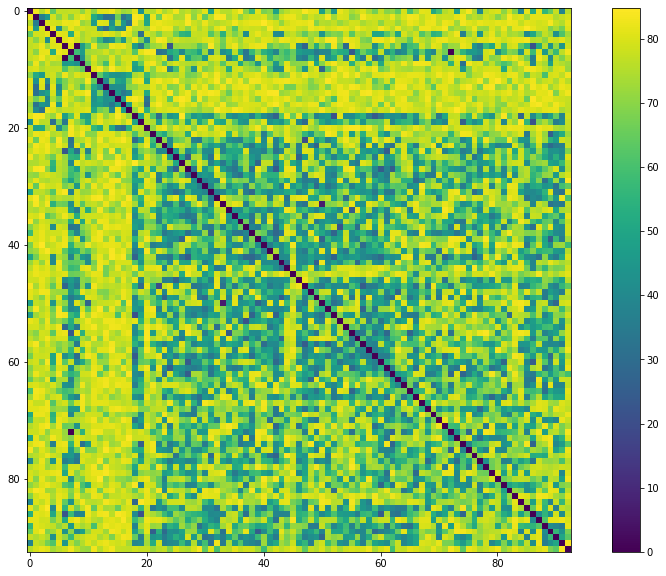

In [763]:
DRaw = np.load("DistMatrixTest.npy")
D = transformDist(DRaw)
plt.imshow(D)
plt.colorbar()
plt.show()

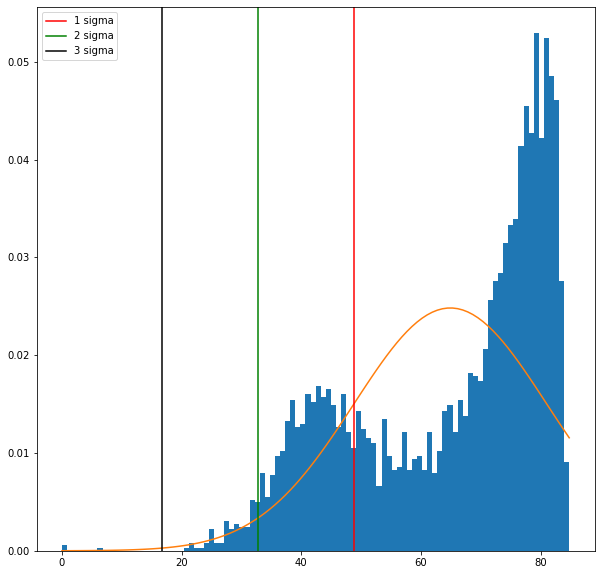

In [764]:
plt.rcParams["figure.figsize"] = (10,10)
Dhist = np.sort(DRaw.ravel())
Dhist = Dhist[~np.isnan(Dhist)]
Dhist = Dhist-np.min(Dhist)
n, bins, patches = plt.hist(Dhist,100,density=True)

mu = np.mean(Dhist)
sigma = np.std(Dhist)

plt.plot(bins,norm.pdf(bins,loc = mu,scale=sigma))

# 1 sigma
plt.axvline(x=mu-sigma,label="1 sigma",c='r')
plt.axvline(x=mu-2*sigma,label="2 sigma",c='g')
plt.axvline(x=mu-3*sigma,label="3 sigma",c='k')
plt.legend()



In [765]:
from sklearn.cluster import MeanShift, estimate_bandwidth
#n, bins, patches = plt.hist(Dhist,100,density=True)


DataReshaped = Dhist.reshape(-1,1)
bandwidth = estimate_bandwidth(DataReshaped, quantile=0.2,n_samples=1000)


ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
ms.fit(DataReshaped)
labels = ms.labels_
cluster_centers = ms.cluster_centers_

labels_unique = np.unique(labels)
n_clusters_ = len(labels_unique)
print("number of estimated clusters : %d" % n_clusters_)

number of estimated clusters : 3


In [766]:
clusterID = np.argmin(ms.cluster_centers_)
print(clusterID)
maxDist = np.max(Dhist[np.argwhere(labels==2)])


distCluster = np.ceil(maxDist)

2


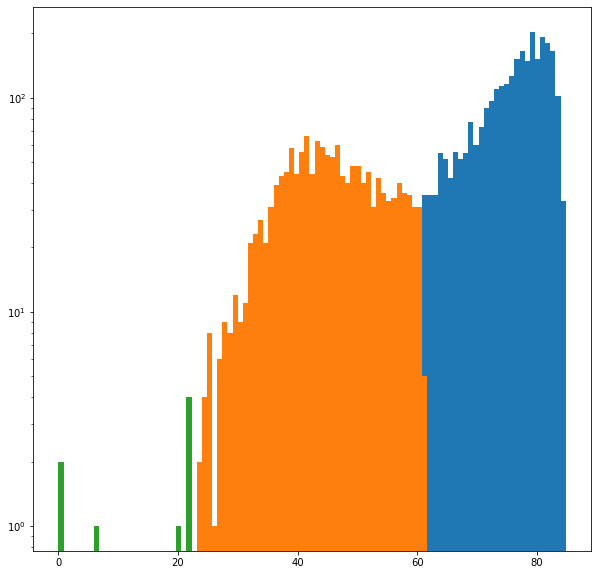

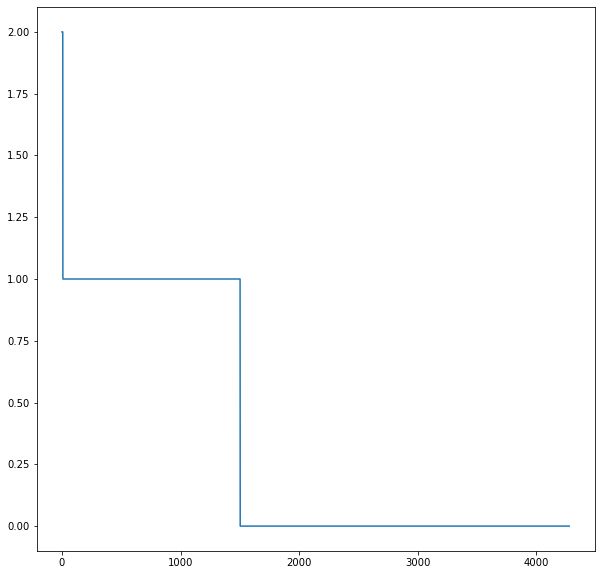

In [767]:
bins = np.linspace(0, np.max(Dhist), 100)

plt.hist(Dhist[np.argwhere(labels==0)],bins,log=True)
plt.hist(Dhist[np.argwhere(labels==1)],bins)
plt.hist(Dhist[np.argwhere(labels==2)],bins)
plt.show()


plt.plot(labels)

In [567]:
## On récupère la limite 
##la limite = le maximum de la valeur pour le cluster dont la moyenne est la plus petite



74.67629720050924
16.413068500783492


Une valeur de distance faible correspond à des monnaies qui se ressemblent

## Représentation des valeurs 
Algorithme T-SNE (t-distributed stochastic neighbor embedding)


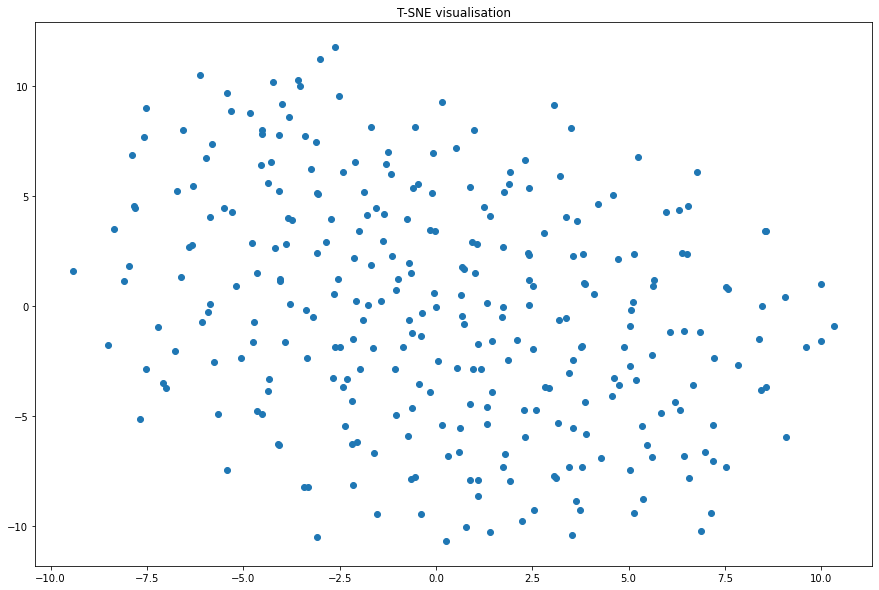

In [508]:
from sklearn.manifold import TSNE


X = TSNE(n_components=2, learning_rate='auto',metric='precomputed', init='random',square_distances=True).fit_transform(D)

plt.scatter(X[:,0],X[:,1])
plt.title("T-SNE visualisation")
plt.show()

## Algorithme Agglomerative Clustering

density-based spatial clustering of applications with noise

In [743]:
from sklearn.cluster import AgglomerativeClustering

threshold = maxDist

C = AgglomerativeClustering(n_clusters=None,affinity='precomputed',linkage = "average" ,distance_threshold=threshold).fit_predict(D)




In [744]:
s = set(C)
print(len(s))

268


In [745]:
def getClusterIdx(C:np.ndarray)->list:
    nbCluster = len(set(C)) - (1 if -1 in C else 0)
    Clusters = []

    #plot points non classées
    Cl0 = X[np.argwhere(C==-1).ravel()]

    for i in range(nbCluster):
        Cli = np.argwhere(C==i).ravel()
        CliCoord = X[Cli]
        Clusters.append(Cli)

    
    return [nbCluster,Clusters]


In [746]:
[nbCluster, Clusters] = getClusterIdx(C)

In [747]:
def getnbClustMore2(Clusters:list)->int:
    
    ClstMore2 = []
    for clst in Clusters:
        n, = np.shape(clst)
        if n >= 2:
            ClstMore2.append(clst)
    return ClstMore2

ClustersMore2 = getnbClustMore2(Clusters)

In [736]:
plt.rcParams["figure.figsize"] = (15,15)


def afficherCluster(Clusters,folderName:str,save=False):
    i = 0
    place = 0
    
    if save:
        ## Création du dossier
        baseDir = os.getcwd()
        folderPath = os.path.join(baseDir,folderName)
        os.mkdir(folderPath)
    
    for clst in Clusters:
        plt.show()
        plt.figure(facecolor='white')
        place = 0
        print("############### CLUSTER %i ############"%(i+1))
        
        
        for j in range(len(clst)):
            idx = clst[j]
            plt.subplot(2,2,j+1,facecolor='white')
            plt.xticks([], [])
            plt.yticks([], [])
            img = cropToCoin(os.path.join(dataPath,dataList[idx]))
            plt.imshow(img)
            plt.title("%s"%(dataList[idx]),)
            if save:
                if j==4 or j == len(clst)-1 :
                    
                    currentCluster = "Cluster_%d.png"%(i+1)
                    currentClusterImagePath = os.path.join(folderPath,currentCluster)
                    plt.savefig(currentClusterImagePath)
                    plt.figure()
                    
                
        
        i=i+1


############### CLUSTER 1 ############


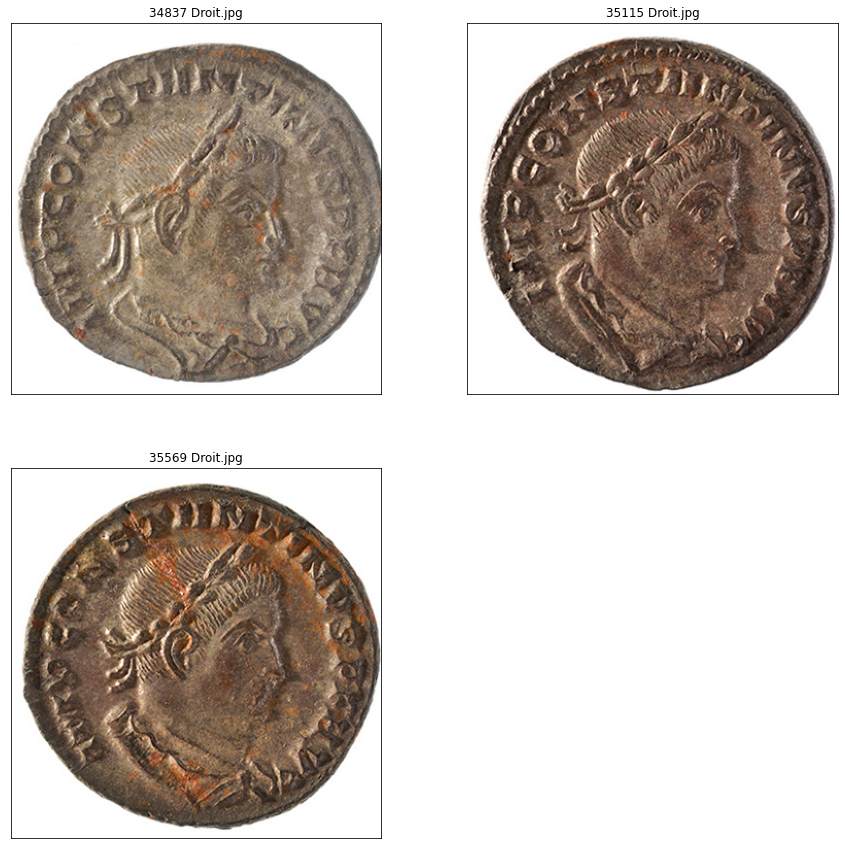

############### CLUSTER 2 ############


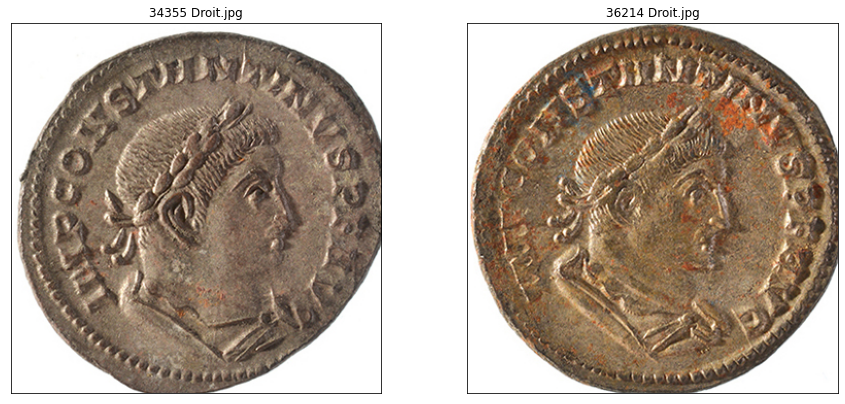

############### CLUSTER 3 ############


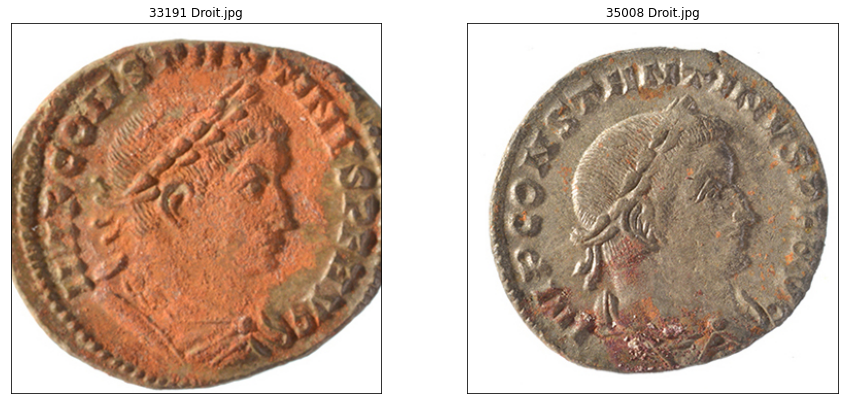

############### CLUSTER 4 ############


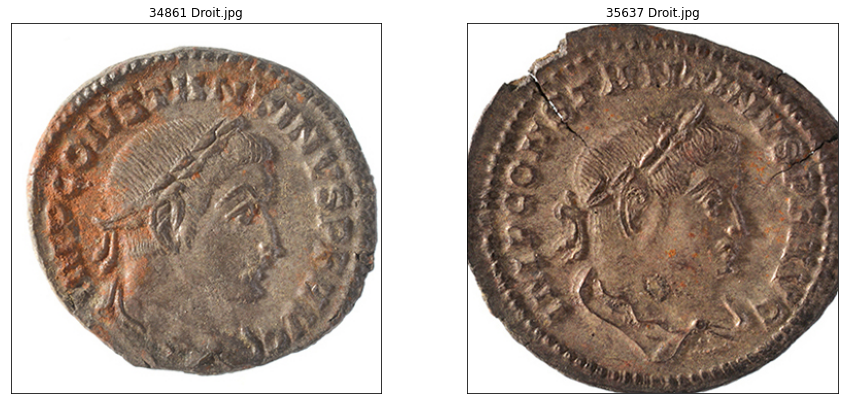

############### CLUSTER 5 ############


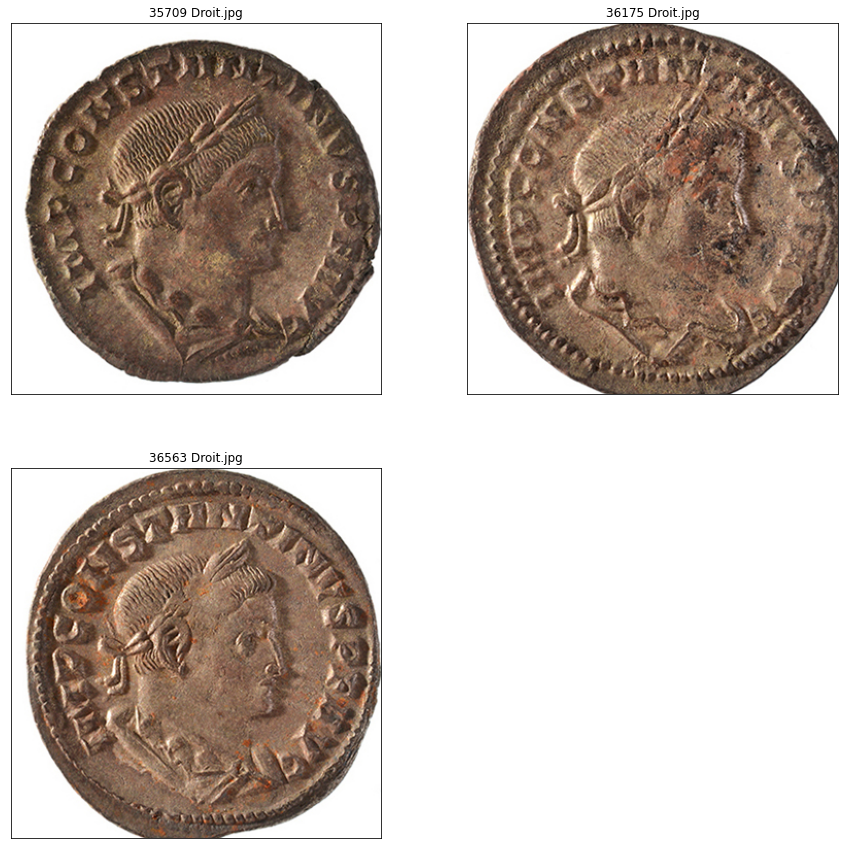

############### CLUSTER 6 ############


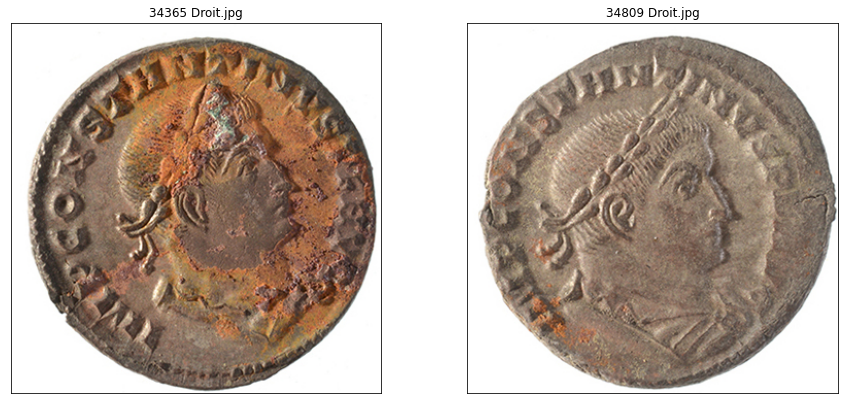

############### CLUSTER 7 ############


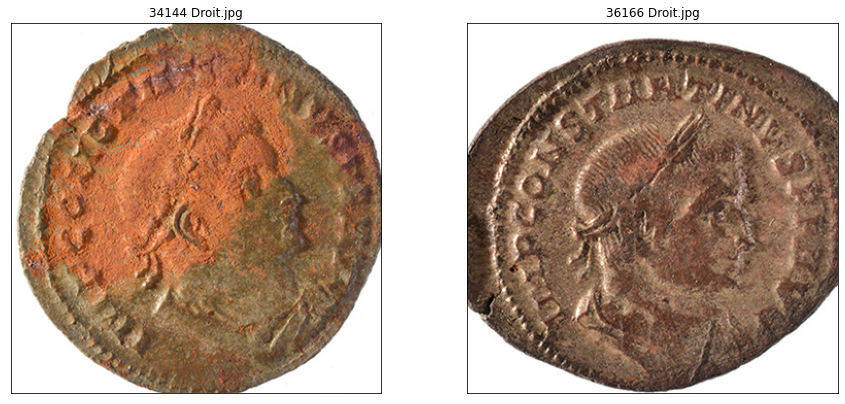

############### CLUSTER 8 ############


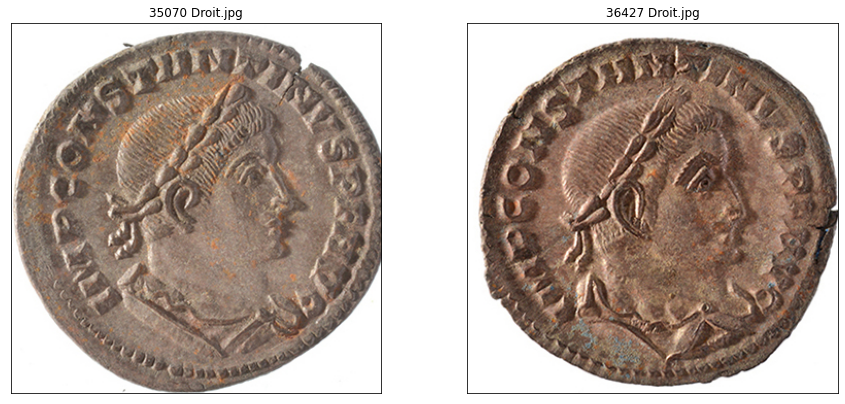

############### CLUSTER 9 ############


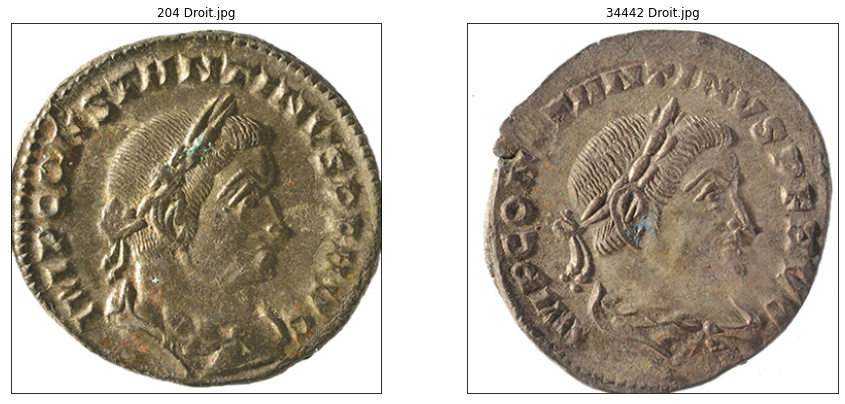

############### CLUSTER 10 ############


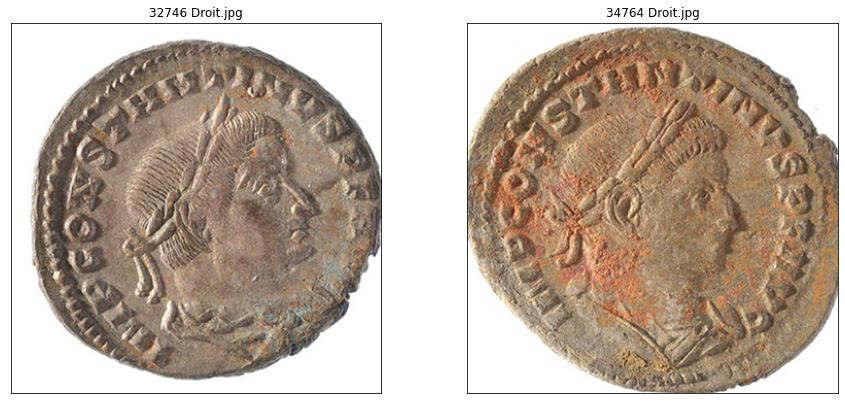

############### CLUSTER 11 ############


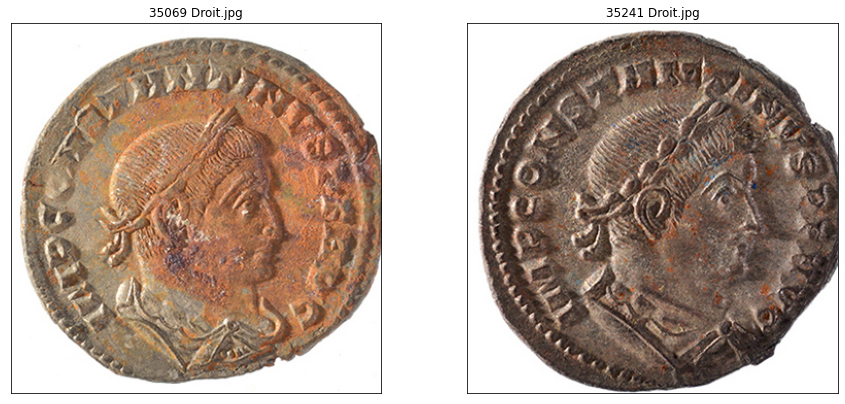

############### CLUSTER 12 ############


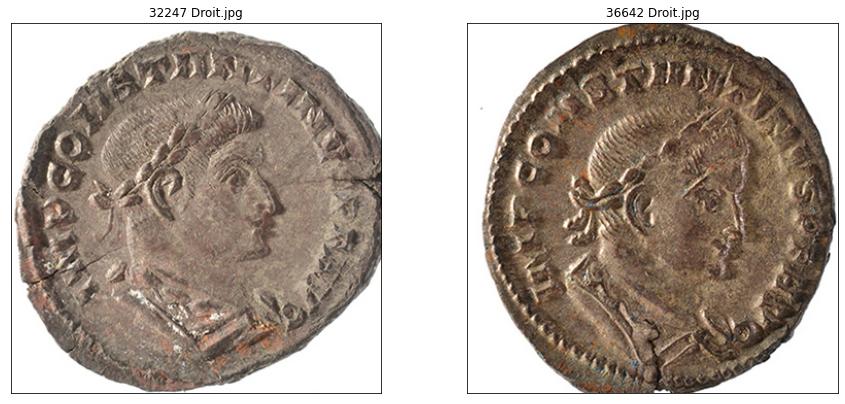

############### CLUSTER 13 ############


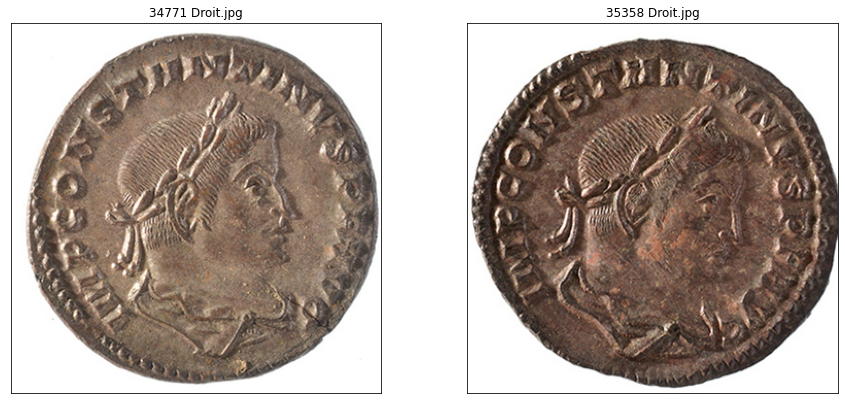

############### CLUSTER 14 ############


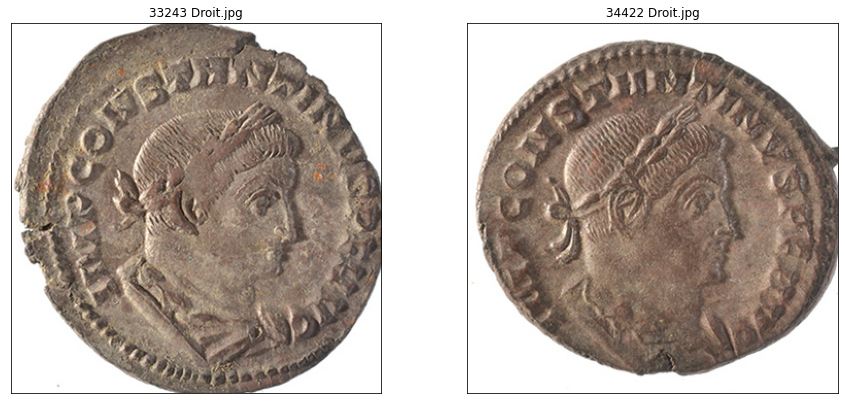

############### CLUSTER 15 ############


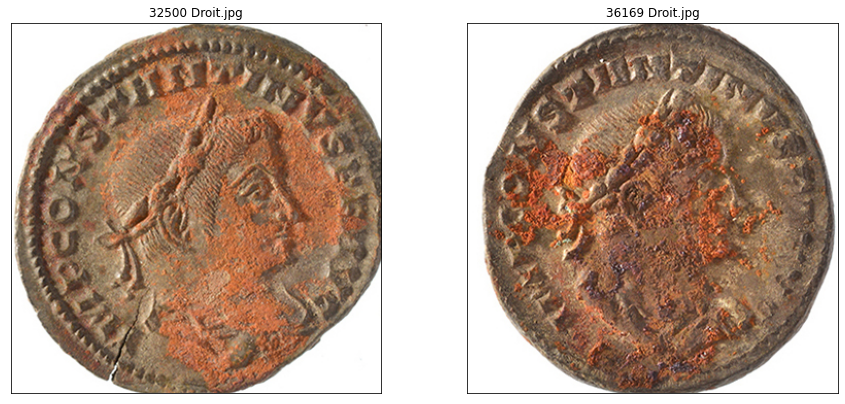

############### CLUSTER 16 ############


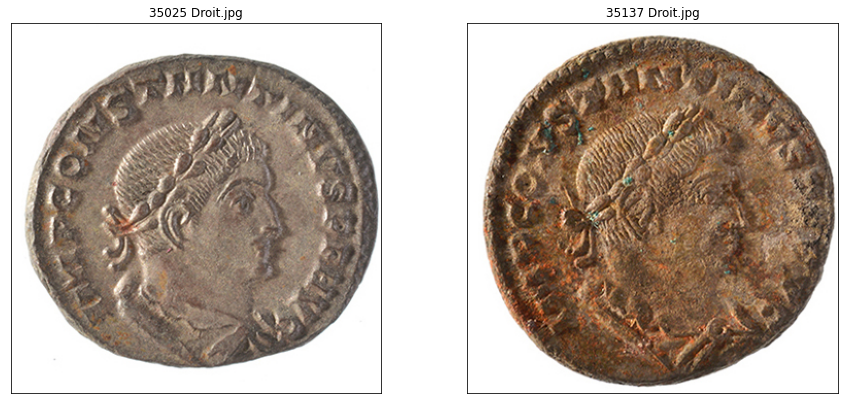

############### CLUSTER 17 ############


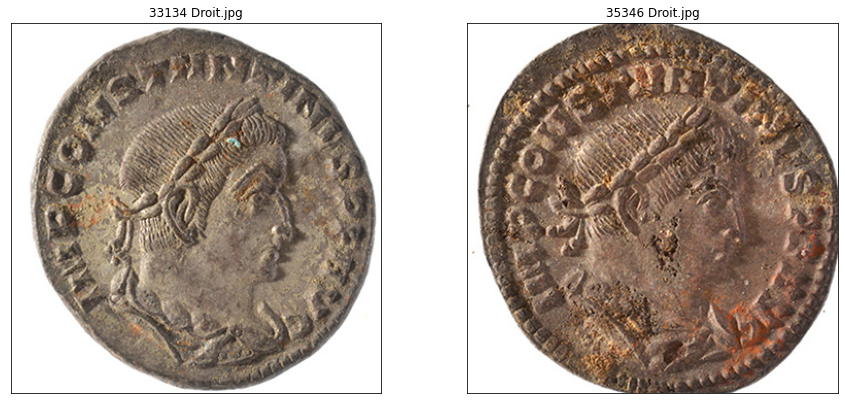

############### CLUSTER 18 ############


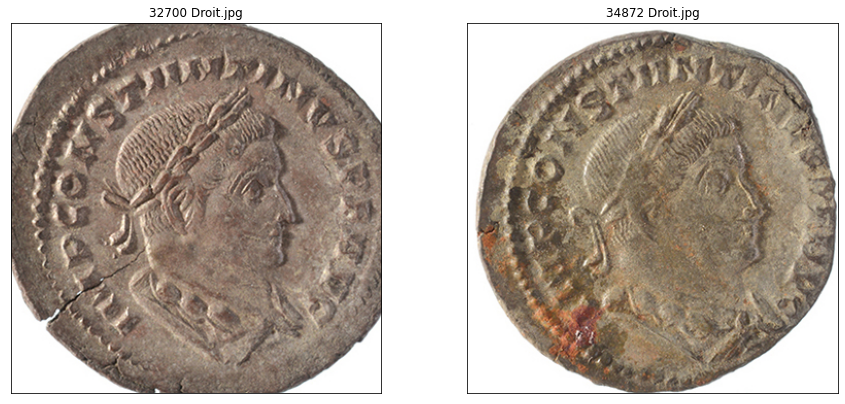

############### CLUSTER 19 ############


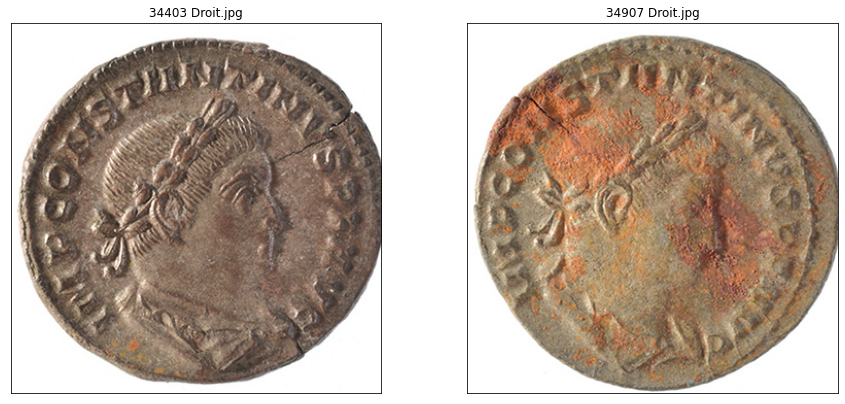

############### CLUSTER 20 ############


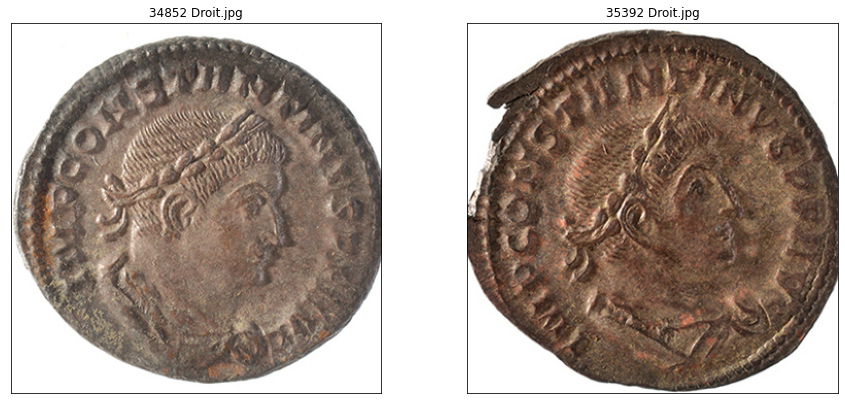

############### CLUSTER 21 ############


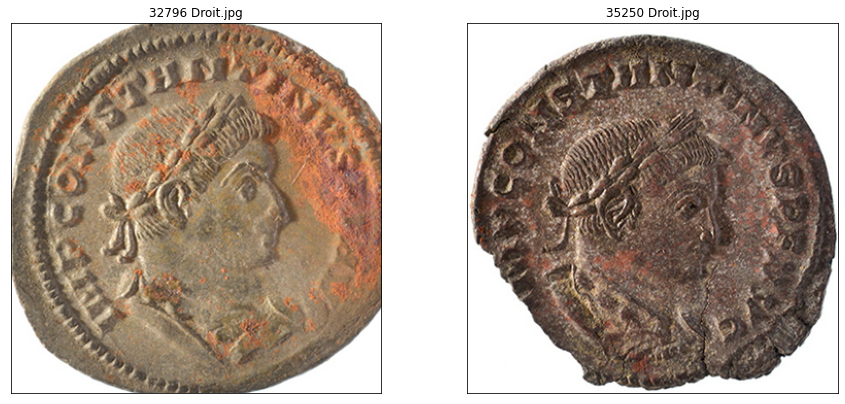

############### CLUSTER 22 ############


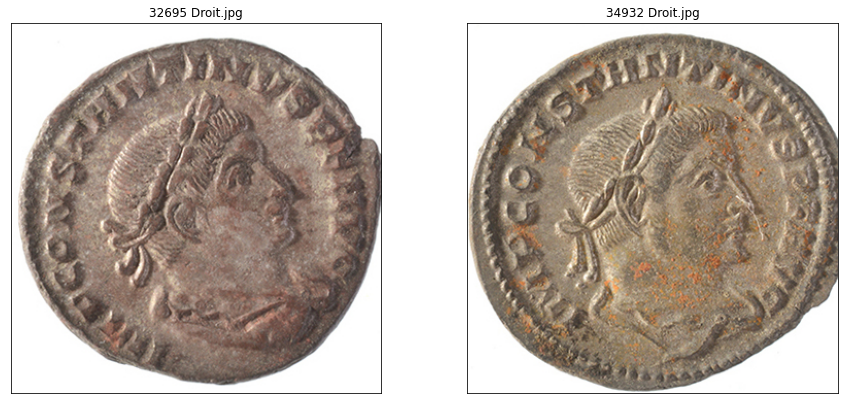

############### CLUSTER 23 ############


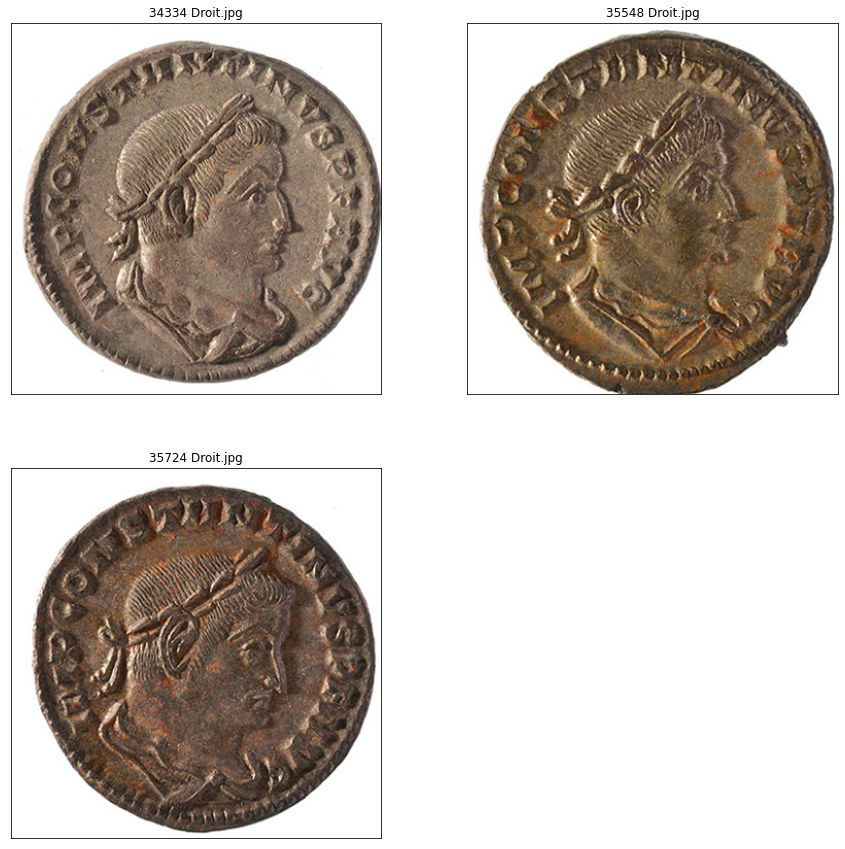

############### CLUSTER 24 ############


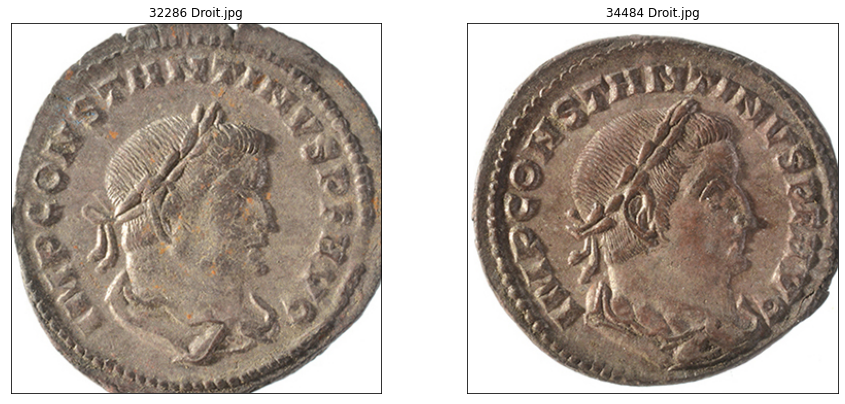

In [737]:
afficherCluster(ClustersMore2,"")

In [516]:
plt.rcParams["figure.figsize"] = (15,10)

In [518]:
def getNbLiaison(Clusters):
    somme = 0
    for clst in Clusters:
        n,=np.shape(clst)
        somme = somme + int(n*(n-1)/2.0)

    return somme

print(getNbLiaison(ClustersMore2))

36


In [519]:
def getnbClusterSize(Clusters:list,size:int)->int:
    
    s= 0
    for clst in Clusters:
        n, = np.shape(clst)
        if n == size:
            s=s+1
    return s



## Analyse de l'algorithme

Objectif trouver 



In [760]:

nbValues = 500

distList = np.linspace(1,100,nbValues)
nbClusterList = np.zeros(nbValues)
nbliaisons = np.zeros(nbValues)

nbClusterSize2 = np.zeros(nbValues)
nbClusterSize3 = np.zeros(nbValues)
nbClusterSize4 = np.zeros(nbValues)
nbClusterSize5 = np.zeros(nbValues)
nbClusterSize6 = np.zeros(nbValues)
nbClusterSize7 = np.zeros(nbValues)
nbClusterSize8 = np.zeros(nbValues)



for i in range(nbValues):
    dist = distList[i]
    C = AgglomerativeClustering(n_clusters=None,affinity='precomputed',linkage = "complete" ,distance_threshold=dist).fit_predict(D)
    [nbCluster, Clusters] = getClusterIdx(C)
    
    
    
    nbClusterList[i] = nbCluster
    
    nbliaisons[i] = getNbLiaison(Clusters)
    
    nbClusterSize2[i] = getnbClusterSize(Clusters,2)
    nbClusterSize3[i] = getnbClusterSize(Clusters,3)
    nbClusterSize4[i] = getnbClusterSize(Clusters,4)
    nbClusterSize5[i] = getnbClusterSize(Clusters,5)
    nbClusterSize6[i] = getnbClusterSize(Clusters,6)
    nbClusterSize7[i] = getnbClusterSize(Clusters,7)

    
    

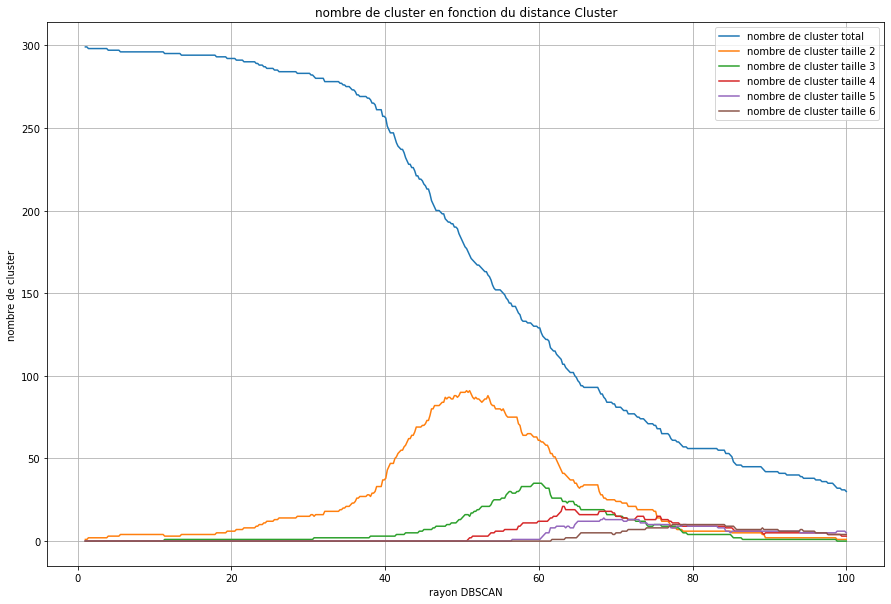

In [761]:
plt.rcParams["figure.figsize"] = (15,10)

plt.plot(distList,nbClusterList,label="nombre de cluster total")
plt.plot(distList,nbClusterSize2,label="nombre de cluster taille 2")
plt.plot(distList,nbClusterSize3,label="nombre de cluster taille 3")
plt.plot(distList,nbClusterSize4,label="nombre de cluster taille 4")
plt.plot(distList,nbClusterSize5,label="nombre de cluster taille 5")
plt.plot(distList,nbClusterSize6,label="nombre de cluster taille 6")

plt.title("nombre de cluster en fonction du distance Cluster")
plt.xlabel("rayon DBSCAN")
plt.ylabel("nombre de cluster")
plt.grid()
plt.legend()
plt.show()


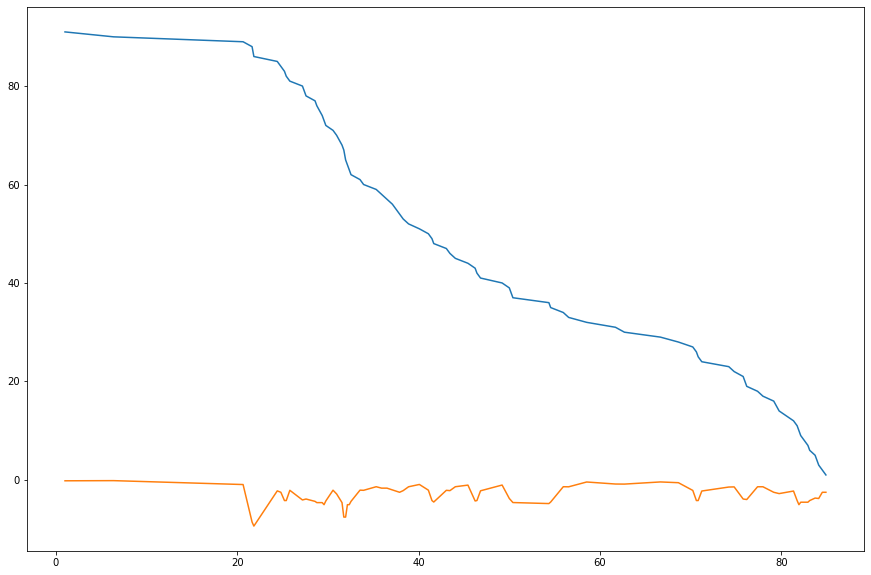

In [610]:
filteredNumber = [nbClusterList[0]]
filteredDistance = [distList[0]]

for i in range(1,500):
    first = nbClusterList[i-1]
    nextOne = nbClusterList[i]
    if(nextOne !=first ):
        filteredNumber.append(nextOne)
        filteredDistance.append(distList[i])
        
        
plt.plot(filteredDistance,filteredNumber)


plt.plot(filteredDistance,np.gradient(filteredNumber,filteredDistance))
        

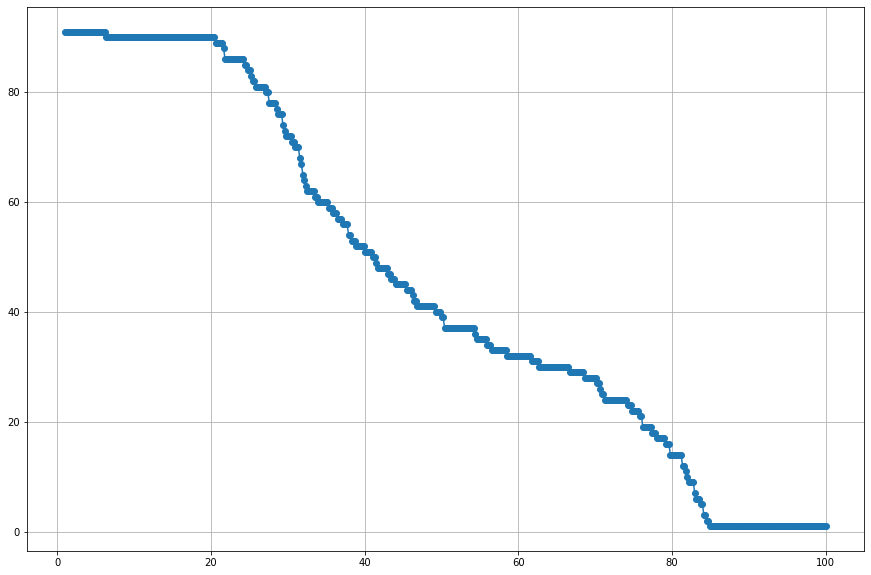

In [609]:


plt.plot(distList,nbClusterList,label="nombre de cluster total",marker = 'o')
plt.grid()

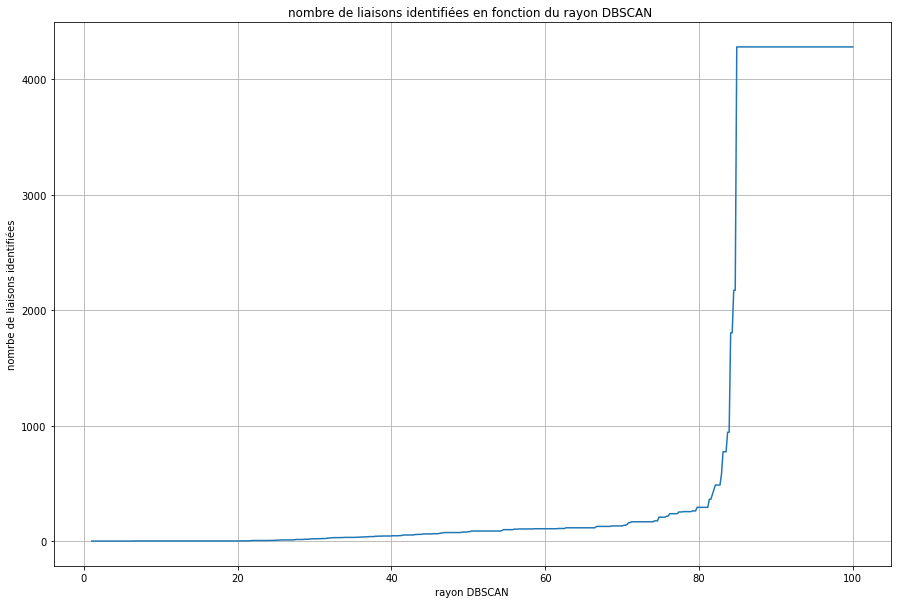

In [594]:
plt.plot(distList,nbliaisons,label="nombre de liaisons")

plt.title("nombre de liaisons identifiées en fonction du rayon DBSCAN ")
plt.xlabel("rayon DBSCAN")
plt.ylabel("nomrbe de liaisons identifiées")
plt.grid()

In [523]:
def piecewise_linear(x, x0, y0, k1, k2):
    return np.piecewise(x, [x < x0, x >= x0], [lambda x:k1*x + y0-k1*x0, lambda x:k2*x + y0-k2*x0])


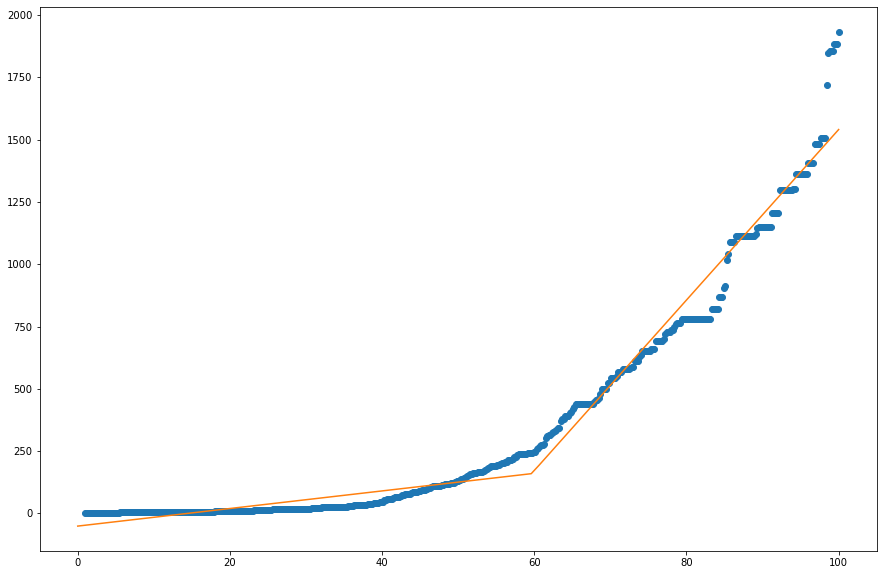

In [525]:
p , e = optimize.curve_fit(piecewise_linear, distList, nbliaisons)
xd = np.linspace(0, 100, 100)
plt.plot(distList, nbliaisons, "o")
plt.plot(xd, piecewise_linear(xd, *p))

In [502]:
p[0]

38.569990906955915